# Import libraries

In [1]:
import warnings
warnings.filterwarnings('ignore')

import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw, ImageEnhance
import albumentations as albu
import cv2
import os 
import glob as gb 
from tqdm.auto import tqdm 

import tensorflow as tf 
from tensorflow import keras 
from keras.models import Model
from tensorflow.keras.losses import BinaryCrossentropy , MSE
from tensorflow.keras.layers import Conv2D , BatchNormalization , LeakyReLU
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import Precision, Recall

In [2]:
gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus:
    print("Name:", gpu.name, "  Type:", gpu.device_type)

Name: /physical_device:GPU:0   Type: GPU


In [3]:
tf.test.is_gpu_available()

True

# Load data

In [4]:
labels = pd.read_csv('../input/global-wheat-detection/train.csv')
labels.head()

,image_id,width,height,bbox,source
0,b6ab77fd7,1024,1024,"[834.0, 222.0, 56.0, 36.0]",usask_1
1,b6ab77fd7,1024,1024,"[226.0, 548.0, 130.0, 58.0]",usask_1
2,b6ab77fd7,1024,1024,"[377.0, 504.0, 74.0, 160.0]",usask_1
3,b6ab77fd7,1024,1024,"[834.0, 95.0, 109.0, 107.0]",usask_1
4,b6ab77fd7,1024,1024,"[26.0, 144.0, 124.0, 117.0]",usask_1


In [5]:
def group_boxes(group) : 
    boundaries = group['bbox'].str.split(',',expand=True)
    boundaries[0] = boundaries[0].str.slice(start=1)
    boundaries[3] = boundaries[3].str.slice(stop=-1)
    
    return boundaries.values.astype(float)

In [6]:
labels = labels.groupby('image_id').apply(group_boxes)

In [7]:
labels[0][0:5]

array([[  0., 654.,  37., 111.],
       [  0., 817., 135.,  98.],
       [  0., 192.,  22.,  81.],
       [  4., 342.,  63.,  38.],
       [ 82., 334.,  82.,  81.]])

In [8]:
train_image_idx = np.unique(labels.index.values)[0:3363]
val_image_idx = np.unique(labels.index.values)[3363:3373]

In [9]:
def load_image(image_id) : 
    image = Image.open('../input/global-wheat-detection/train/' + image_id + ".jpg")
    image = image.resize((256,256))
    
    return np.asarray(image)

In [10]:
train_pixels = {} 
train_labels = {} 

for image_id in tqdm(train_image_idx) : 
    train_pixels[image_id] = load_image(image_id) 
    train_labels[image_id] = labels[image_id].copy() / 4

  0%|          | 0/3363 [00:00<?, ?it/s]

In [11]:
val_pixels = {} 
val_labels = {} 
for image_id in tqdm(val_image_idx) : 
    val_pixels[image_id] = load_image(image_id) 
    val_labels[image_id] = labels[image_id].copy() / 4

  0%|          | 0/10 [00:00<?, ?it/s]

# Create bounding boxes

In [67]:
def draw_bboxes(image_id , bboxes) : 
    image = Image.open('../input/global-wheat-detection/train/' + image_id + ".jpg")
    image = image.resize((256,256)) 
    
    draw = ImageDraw.Draw(image) 
    
    for bbox in bboxes : 
        draw_bbox(draw,bbox) 
        
    return np.asarray(image) 

def draw_bbox(draw , bbox) : 
    x , y , width , height = bbox 
    draw.rectangle([x , y , x+width , y+height] , width = 2 , outline = 'red')

In [68]:
def show_images(image_idx , bboxes) : 
    pixels = [] 
    
    for image_id in image_idx : 
        pixels.append(
            draw_bboxes(image_id , bboxes[image_id])
        )
        
    num_of_images = len(image_idx) 
    
    fig,axes = plt.subplots(1,num_of_images ,figsize=(5 * num_of_images, 5 * num_of_images) )
    
    for i , image_pixels in enumerate(pixels) : 
        axes[i].imshow(image_pixels)

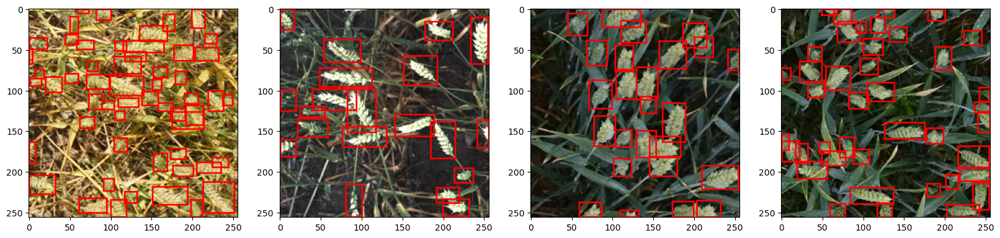

In [69]:
show_images(train_image_idx[0:4] , train_labels)

In [15]:
tiny_bboxes = []

for i, image_id in enumerate(train_image_idx):
    for label in train_labels[image_id]:
        if label[2] * label[3] <= 10 and label[2] * label[3] != 0:
            tiny_bboxes.append(i)

            
print(str(len(tiny_bboxes)) + ' tiny bounding boxes found')

50 tiny bounding boxes found


In [16]:
huge_bboxes = []

for i, image_id in enumerate(train_image_idx):
    for label in train_labels[image_id]:
        if label[2] * label[3] > 8000:
            huge_bboxes.append(i)

            
print(str(len(huge_bboxes)) + ' huge bounding boxes found')

13 huge bounding boxes found


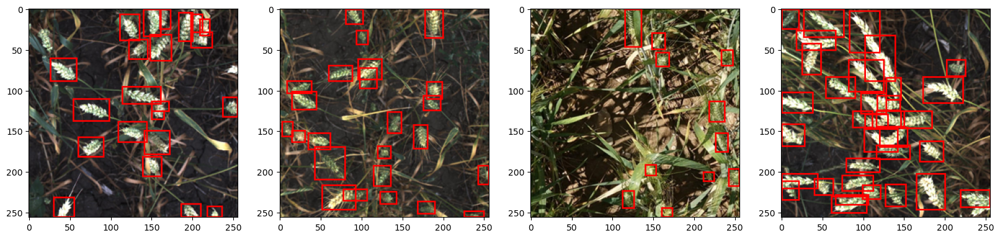

In [70]:
show_images(train_image_idx[562:566], train_labels)

In [18]:
def clean_labels(train_image_ids, train_labels):
    good_labels = {}
    
    for i, image_id in enumerate(train_image_ids):
        good_labels[image_id] = []
        
        for j, label in enumerate(train_labels[image_id]):

            # remove huge bbox
            if label[2] * label[3] > 8000 and i not in [1079, 1371, 2020]:
                continue

            # remove tiny bbox
            elif label[2] < 5 or label[3] < 5:
                continue
                
            else:
                good_labels[image_id].append(
                    train_labels[image_id][j]
                )
                
    return good_labels

train_labels = clean_labels(train_image_idx, train_labels)

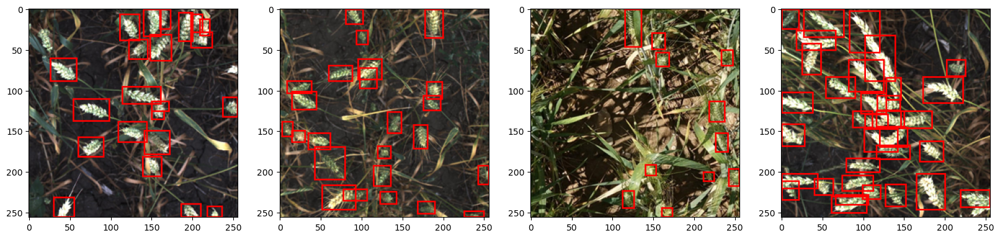

In [71]:
show_images(train_image_idx[562:566], train_labels)

# Data pipeline

In [20]:
class DataGenerator(tf.keras.utils.Sequence) : 
    def __init__(self , image_ids , image_pixels , labels = None , batch_size = 1 , shuffle= False , augment = False) : 
        self.image_ids = image_ids 
        self.image_pixels = image_pixels 
        self.labels = labels 
        self.batch_size = batch_size 
        self.shuffle = shuffle 
        self.augment = augment 
        self.on_epoch_end()
        
        self.image_grid = self.form_image_grid() 
        
    def form_image_grid(self) : 
        image_grid = np.zeros((32,32,4)) 
            
        cell = [0 , 0 , 256 / 32 , 256 / 32] 
            
        for i in range(0 , 32) : 
            for j in range(0 , 32) : 
                image_grid[i,j] = cell 
                    
                cell[0] = cell[0] + cell[2] 
                    
            cell[0] = 0 
            cell[1] = cell[1] + cell[3] 
                
        return image_grid
        
        
    def __len__(self) : 
        return int(np.floor(len(self.image_ids) / self.batch_size))
    
    def on_epoch_end(self):
        self.indexes = np.arange(len(self.image_ids))

        if self.shuffle == True:
            np.random.shuffle(self.indexes) 

In [21]:
DataGenerator.train_augmentations = albu.Compose([
        albu.RandomSizedCrop(
            min_max_height=(200, 200), 
            height=256, 
            width=256, 
            p=0.8
        ),
        albu.OneOf([
            albu.Flip(),
            albu.RandomRotate90(),
        ], p=1),
        albu.OneOf([
            albu.HueSaturationValue(),
            albu.RandomBrightnessContrast()
        ], p=1),
        albu.OneOf([
            albu.GaussNoise(),
            albu.GlassBlur(),
            albu.ISONoise(),
            albu.MultiplicativeNoise(),
        ], p=0.5),
        albu.Cutout(
            num_holes=8, 
            max_h_size=16, 
            max_w_size=16, 
            fill_value=0, 
            p=0.5
        ),
        albu.CLAHE(p=1),
        albu.ToGray(p=1),
    ], 
    bbox_params={'format': 'coco', 'label_fields': ['labels']})

DataGenerator.val_augmentations = albu.Compose([
    albu.CLAHE(p=1),
    albu.ToGray(p=1),
])

In [22]:
def __getitem__(self, index):
    indexes = self.indexes[index * self.batch_size:(index + 1) * self.batch_size]

    batch_ids = [self.image_ids[i] for i in indexes]

    X, y = self.__data_generation(batch_ids)

    return X, y


def __data_generation(self, batch_ids):
    X, y = [], []

    # Generate data
    for i, image_id in enumerate(batch_ids):
        pixels = self.image_pixels[image_id]
        bboxes = self.labels[image_id]

        if self.augment:     
            pixels, bboxes = self.augment_image(pixels, bboxes)
        else:
            pixels = self.contrast_image(pixels)
            bboxes = self.form_label_grid(bboxes)

        X.append(pixels)
        y.append(bboxes)

    return np.array(X), np.array(y)


def augment_image(self, pixels, bboxes):
    bbox_labels = np.ones(len(bboxes))

    aug_result = self.train_augmentations(image=pixels, bboxes=bboxes, labels=bbox_labels)

    bboxes = self.form_label_grid(aug_result['bboxes'])

    return np.array(aug_result['image']) / 255, bboxes


def contrast_image(self, pixels):        
    aug_result = self.val_augmentations(image=pixels)
    return np.array(aug_result['image']) / 255


DataGenerator.__getitem__ = __getitem__
DataGenerator.__data_generation = __data_generation
DataGenerator.augment_image = augment_image
DataGenerator.contrast_image = contrast_image

In [23]:
def form_label_grid(self, bboxes):
    label_grid = np.zeros((32, 32, 10))

    for i in range(0, 32):
        for j in range(0, 32):
            cell = self.image_grid[i,j]
            label_grid[i,j] = self.rect_intersect(cell, bboxes)

    return label_grid


def rect_intersect(self, cell, bboxes): 
    cell_x, cell_y, cell_width, cell_height = cell
    cell_x_max = cell_x + cell_width 
    cell_y_max = cell_y + cell_height
    
    anchor_one = np.array([0, 0, 0, 0, 0])
    anchor_two = np.array([0, 0, 0, 0, 0])

    # check all boxes
    for bbox in bboxes:
        box_x, box_y, box_width, box_height = bbox
        box_x_centre = box_x + (box_width / 2)
        box_y_centre = box_y + (box_height / 2)

        if(box_x_centre >= cell_x and box_x_centre < cell_x_max and box_y_centre >= cell_y and box_y_centre < cell_y_max):
            
            if anchor_one[0] == 0:
                anchor_one = self.yolo_shape(
                    [box_x, box_y, box_width, box_height], 
                    [cell_x, cell_y, cell_width, cell_height]
                )
            
            elif anchor_two[0] == 0:
                anchor_two = self.yolo_shape(
                    [box_x, box_y, box_width, box_height], 
                    [cell_x, cell_y, cell_width, cell_height]
                )
                
            else:
                break

    return np.concatenate((anchor_one, anchor_two), axis=None)


def yolo_shape(self, box, cell):
    box_x, box_y, box_width, box_height = box
    cell_x, cell_y, cell_width, cell_height = cell

    # top left x,y to centre x,y
    box_x = box_x + (box_width / 2)
    box_y = box_y + (box_height / 2)

    # offset bbox x,y to cell x,y
    box_x = (box_x - cell_x) / cell_width
    box_y = (box_y - cell_y) / cell_height

    # bbox width,height relative to cell width,height
    box_width = box_width / 256
    box_height = box_height / 256

    return [1, box_x, box_y, box_width, box_height]


DataGenerator.form_label_grid = form_label_grid
DataGenerator.rect_intersect = rect_intersect
DataGenerator.yolo_shape = yolo_shape

In [24]:
train_generator = DataGenerator(
    train_image_idx,
    train_pixels,
    train_labels, 
    batch_size=6, 
    shuffle=True,
    augment=True
)

val_generator = DataGenerator(
    val_image_idx, 
    val_pixels,
    val_labels, 
    batch_size=10,
    shuffle=False,
    augment=False
)

image_grid = train_generator.image_grid

In [25]:
x_train_sample , y_train_sample = next(iter(train_generator))

In [26]:
print(f"The size of the training generator is : {train_generator.__len__()} batches of {train_generator.batch_size}")

The size of the training generator is : 560 batches of 6


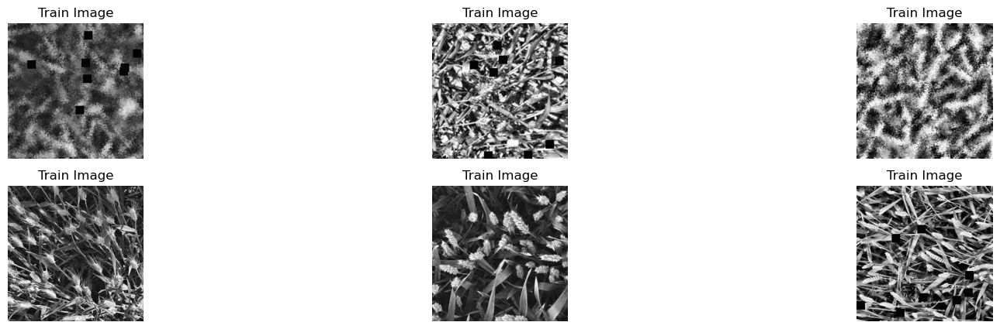

In [73]:
fig, axis = plt.subplots(2, 3, figsize=(20, 5))
for i, ax in enumerate(axis.flat):
    img = x_train_sample[i]
    ax.imshow(img)
    ax.set(title = 'Train Image')
    ax.axis('off')
        

In [28]:
x_val_sample , y_val_sample = next(iter(val_generator))

In [29]:
print(f"The size of the validation generator is : {val_generator.__len__()} batches of {val_generator.batch_size}")

The size of the validation generator is : 1 batches of 10


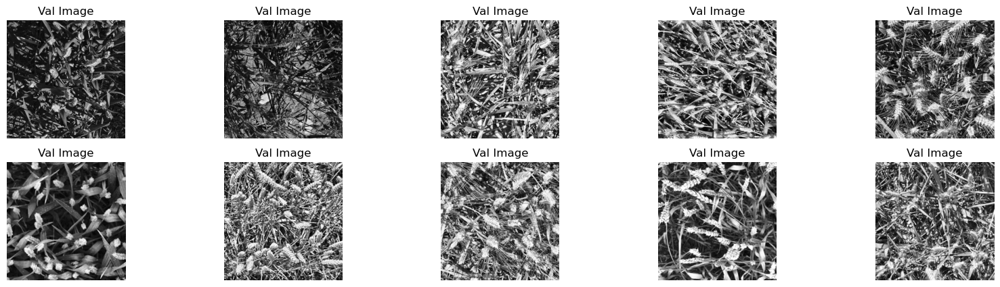

In [74]:
fig, axis = plt.subplots(2, 5, figsize=(20, 5))
for i, ax in enumerate(axis.flat):
    img = x_val_sample[i]
    ax.imshow(img)
    ax.set(title = 'Val Image')
    ax.axis('off')
        

# Build our model 

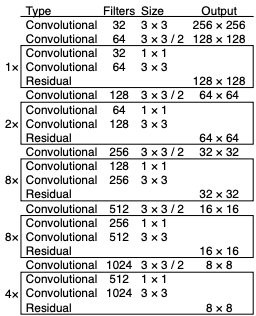

In [31]:
def YOLOV3(in_channels , out_channels) : 
    inputs = keras.Input(shape = in_channels) 
    
    x = Conv2D(32 , (3,3) , strides = (1,1) , padding = 'same')(inputs)
    x = BatchNormalization()(x) 
    x= LeakyReLU(alpha=0.1)(x) 
    
    # block 1 
    
    x = Conv2D(64,(3,3) , strides = (1,1) , padding = 'same')(x)
    x = BatchNormalization()(x)
    x= LeakyReLU(alpha=0.1)(x)
    
    PreviousBlock = x 
    
    for i in range(2) : 
        x = Conv2D(32,(3,3) , strides = (1,1) , padding = 'same')(x)
        x = BatchNormalization()(x)
        x= LeakyReLU(alpha=0.1)(x)
        
        x = Conv2D(64,(3,3) , strides = (1,1) , padding = 'same')(x)
        x = BatchNormalization()(x)
        x= LeakyReLU(alpha=0.1)(x)
        
        x = keras.layers.Add()([PreviousBlock,x])
        x = LeakyReLU(alpha=0.1)(x)
        
        PreviousBlock = x
        
        
    
    # block 2 
    
    x = Conv2D(128 , (3,3) , strides = (1,1) , padding = 'same')(x)
    x = BatchNormalization()(x) 
    x= LeakyReLU(alpha=0.1)(x)
    
    PreviousBlock = x
    
    for i in range(2) : 
        x = Conv2D(64,(3,3) , strides = (1,1) , padding = 'same')(x)
        x = BatchNormalization()(x)
        x= LeakyReLU(alpha=0.1)(x)
        
        x = Conv2D(128,(3,3) , strides = (1,1) , padding = 'same')(x)
        x = BatchNormalization()(x)
        x= LeakyReLU(alpha=0.1)(x)
        
        x = keras.layers.Add()([PreviousBlock,x])
        x = LeakyReLU(alpha=0.1)(x)
        
        PreviousBlock = x
    
    
    # block3 
    
    x = Conv2D(256 , (3,3) , strides = (2,2) , padding = 'same')(x) 
    x = BatchNormalization()(x)
    x= LeakyReLU(alpha=0.1)(x)
    
    PreviousBlock = x
    
    for i in range(8) : 
        x = Conv2D(128,(3,3) , strides = (1,1) , padding = 'same')(x)
        x = BatchNormalization()(x)
        x= LeakyReLU(alpha=0.1)(x)
        
        x = Conv2D(256,(3,3) , strides = (1,1) , padding = 'same')(x)
        x = BatchNormalization()(x)
        x= LeakyReLU(alpha=0.1)(x)
        
        x = keras.layers.Add()([PreviousBlock,x])
        x = LeakyReLU(alpha=0.1)(x)
        
        PreviousBlock = x
        
        
    # block 4 
    
    x = Conv2D(512 , (3,3) , strides = (2,2) , padding = 'same')(x) 
    x = BatchNormalization()(x)
    x= LeakyReLU(alpha=0.1)(x)
    
    PreviousBlock = x
    
    for i in range(8) : 
        x = Conv2D(256,(3,3) , strides = (1,1) , padding = 'same')(x)
        x = BatchNormalization()(x)
        x= LeakyReLU(alpha=0.1)(x)
        
        x = Conv2D(512,(3,3) , strides = (1,1) , padding = 'same')(x)
        x = BatchNormalization()(x)
        x= LeakyReLU(alpha=0.1)(x)
        
        x = keras.layers.Add()([PreviousBlock,x])
        x = LeakyReLU(alpha=0.1)(x)
        
        PreviousBlock = x
        
        
        
    # block 5 
    
    x = Conv2D(1024 , (3,3) , strides = (2,2) , padding = 'same')(x) 
    x = BatchNormalization()(x)
    x= LeakyReLU(alpha=0.1)(x)
    
    PreviousBlock = x
    
    for i in range(8) : 
        x = Conv2D(512,(3,3) , strides = (1,1) , padding = 'same')(x)
        x = BatchNormalization()(x)
        x= LeakyReLU(alpha=0.1)(x)
        
        x = Conv2D(1024,(3,3) , strides = (1,1) , padding = 'same')(x)
        x = BatchNormalization()(x)
        x= LeakyReLU(alpha=0.1)(x)
        
        x = keras.layers.Add()([PreviousBlock,x])
        x = LeakyReLU(alpha=0.1)(x)
        
        PreviousBlock = x
        
        
    # output layer 
    
    x = Conv2D(512 , (3,3) , strides = (1,1) , padding = 'same')(x) 
    x = BatchNormalization()(x)
    x= LeakyReLU(alpha=0.1)(x)
    
    x = Conv2D(256 , (3,3) , strides = (1,1) , padding = 'same')(x) 
    x = BatchNormalization()(x)
    x= LeakyReLU(alpha=0.1)(x)
    
    x = Conv2D(128 , (3,3) , strides = (1,1) , padding = 'same')(x) 
    x = BatchNormalization()(x)
    x= LeakyReLU(alpha=0.1)(x)
    
    
    outputs = Conv2D(out_channels , (1,1) , strides = (1,1) , padding='same' , activation = 'sigmoid')(x)
    
    
    model = Model(inputs , outputs)
    
    return model 

In [32]:
keras.backend.clear_session()

In [33]:
model = YOLOV3(in_channels=(256, 256,3), out_channels=10)

In [34]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 256, 256, 32  896         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 256, 256, 32  128        ['conv2d[0][0]']                 
 alization)                     )                                                             

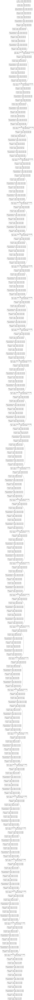

In [35]:
keras.utils.plot_model(model, show_shapes=True)

In [36]:
def get_mask(y_true):
    anchor_one_mask = tf.where(
        y_true[:,:,:,0] == 0, 
        0.5, 
        5.0
    )
    
    anchor_two_mask = tf.where(
        y_true[:,:,:,5] == 0, 
        0.5, 
        5.0
    )
    
    bboxes_mask = tf.concat(
        [anchor_one_mask,anchor_two_mask],
        axis=0
    )
    
    return bboxes_mask

In [37]:
def custom_loss(y_true, y_pred):
    binary_crossentropy = prob_loss = BinaryCrossentropy(
        reduction= keras.losses.Reduction.SUM_OVER_BATCH_SIZE
    )
    
    prob_loss = binary_crossentropy(
        tf.concat([y_true[:,:,:,0], y_true[:,:,:,5]], axis=0), 
        tf.concat([y_pred[:,:,:,0], y_pred[:,:,:,5]], axis=0)
    )
    
    xy_loss = MSE(
        tf.concat([y_true[:,:,:,1:3], y_true[:,:,:,6:8]], axis=0), 
        tf.concat([y_pred[:,:,:,1:3], y_pred[:,:,:,6:8]], axis=0)
    )
    
    wh_loss = MSE(
        tf.concat([y_true[:,:,:,3:5], y_true[:,:,:,8:10]], axis=0), 
        tf.concat([y_pred[:,:,:,3:5], y_pred[:,:,:,8:10]], axis=0)
    )
    
    bboxes_mask = get_mask(y_true)
    
    xy_loss = xy_loss * bboxes_mask
    wh_loss = wh_loss * bboxes_mask
    
    return prob_loss + xy_loss + wh_loss

# Train our model

In [38]:
model.compile(
    optimizer= Adam(learning_rate=0.0001) , 
    loss = custom_loss
)

In [39]:
epochs = 10

In [40]:
with tf.device("/GPU:0") : 
    history = model.fit_generator(
    train_generator , 
    validation_data= val_generator , 
    epochs = epochs 
)

Epoch 1/10
560/560 [==============================] - 551s 887ms/step - loss: 0.2513 - val_loss: 0.1344
Epoch 2/10
560/560 [==============================] - 492s 877ms/step - loss: 0.0970 - val_loss: 0.0950
Epoch 3/10
560/560 [==============================] - 492s 878ms/step - loss: 0.0732 - val_loss: 0.0821
Epoch 4/10
560/560 [==============================] - 492s 877ms/step - loss: 0.0645 - val_loss: 0.0693
Epoch 5/10
560/560 [==============================] - 492s 878ms/step - loss: 0.0604 - val_loss: 0.0731
Epoch 6/10
560/560 [==============================] - 492s 878ms/step - loss: 0.0574 - val_loss: 0.0609
Epoch 7/10
560/560 [==============================] - 492s 878ms/step - loss: 0.0552 - val_loss: 0.0601
Epoch 8/10
560/560 [==============================] - 492s 878ms/step - loss: 0.0536 - val_loss: 0.0622
Epoch 9/10
560/560 [==============================] - 492s 877ms/step - loss: 0.0526 - val_loss: 0.0572
Epoch 10/10
560/560 [==============================] - 492s 878m

# Make predictions

In [41]:
def prediction_to_bbox(bboxes, image_grid):    
    bboxes = bboxes.copy()
    
    im_width = (image_grid[:,:,2] * 32)
    im_height = (image_grid[:,:,3] * 32)
    
    # descale x,y
    bboxes[:,:,1] = (bboxes[:,:,1] * image_grid[:,:,2]) + image_grid[:,:,0]
    bboxes[:,:,2] = (bboxes[:,:,2] * image_grid[:,:,3]) + image_grid[:,:,1]
    bboxes[:,:,6] = (bboxes[:,:,6] * image_grid[:,:,2]) + image_grid[:,:,0]
    bboxes[:,:,7] = (bboxes[:,:,7] * image_grid[:,:,3]) + image_grid[:,:,1]
    
    # descale width,height
    bboxes[:,:,3] = bboxes[:,:,3] * im_width 
    bboxes[:,:,4] = bboxes[:,:,4] * im_height
    bboxes[:,:,8] = bboxes[:,:,8] * im_width 
    bboxes[:,:,9] = bboxes[:,:,9] * im_height
    
    # centre x,y to top left x,y
    bboxes[:,:,1] = bboxes[:,:,1] - (bboxes[:,:,3] / 2)
    bboxes[:,:,2] = bboxes[:,:,2] - (bboxes[:,:,4] / 2)
    bboxes[:,:,6] = bboxes[:,:,6] - (bboxes[:,:,8] / 2)
    bboxes[:,:,7] = bboxes[:,:,7] - (bboxes[:,:,9] / 2)
    
    # width,heigth to x_max,y_max
    bboxes[:,:,3] = bboxes[:,:,1] + bboxes[:,:,3]
    bboxes[:,:,4] = bboxes[:,:,2] + bboxes[:,:,4]
    bboxes[:,:,8] = bboxes[:,:,6] + bboxes[:,:,8]
    bboxes[:,:,9] = bboxes[:,:,7] + bboxes[:,:,9]
    
    return bboxes

In [42]:
def non_max_suppression(predictions, top_n):
    probabilities = np.concatenate((predictions[:,:,0].flatten(), predictions[:,:,5].flatten()), axis=None)
    
    first_anchors = predictions[:,:,1:5].reshape((32*32, 4))
    second_anchors = predictions[:,:,6:10].reshape((32*32, 4))
    
    bboxes = np.concatenate(
        (first_anchors,second_anchors),
        axis=0
    )
    
    bboxes = switch_x_y(bboxes)
    bboxes, probabilities = select_top(probabilities, bboxes, top_n=top_n)
    bboxes = switch_x_y(bboxes)
    
    return bboxes


def switch_x_y(bboxes):
    x1 = bboxes[:,0].copy()
    y1 = bboxes[:,1].copy()
    x2 = bboxes[:,2].copy()
    y2 = bboxes[:,3].copy()
    
    bboxes[:,0] = y1
    bboxes[:,1] = x1
    bboxes[:,2] = y2
    bboxes[:,3] = x2
    
    return bboxes


def select_top(probabilities, boxes, top_n=10):
    top_indices = tf.image.non_max_suppression(
        boxes = boxes, 
        scores = probabilities, 
        max_output_size = top_n, 
        iou_threshold = 0.3,
        score_threshold = 0.3
    )
    
    top_indices = top_indices.numpy()
    
    return boxes[top_indices], probabilities[top_indices]

In [43]:
def process_predictions(predictions, image_ids, image_grid):
    bboxes = {}
    
    for i, image_id in enumerate(image_ids):
        predictions[i] = prediction_to_bbox(predictions[i], image_grid)
        bboxes[image_id] = non_max_suppression(predictions[i], top_n=100)
        
        # back to coco shape
        bboxes[image_id][:,2:4] = bboxes[image_id][:,2:4] - bboxes[image_id][:,0:2]
    
    return bboxes

In [44]:
with tf.device("/GPU:0") : 
    val_predictions = model.predict(val_generator)
    val_predictions = process_predictions(val_predictions, val_image_idx, image_grid)

1/1 [==============================] - 2s 2s/step


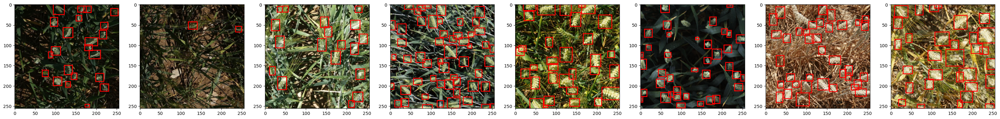

In [66]:
show_images(val_image_idx[0:8], val_predictions)

# Evaluate model 

In [55]:
print(f"The training loss is : {history.history['loss'][-1]:0.3f}\n\n")
print(f"The validation loss is : {history.history['val_loss'][-1]:0.3f}")

The training loss is : 0.051


The validation loss is : 0.054


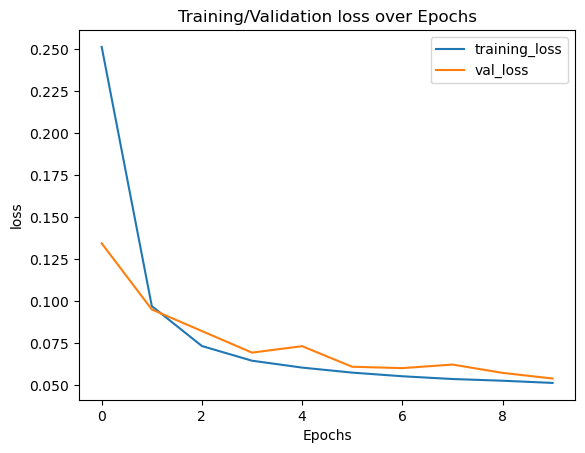

In [56]:
plt.plot(history.history['loss'] , label='training_loss')
plt.plot(history.history['val_loss'] , label='val_loss')
plt.title('Training/Validation loss over Epochs')
plt.xlabel('Epochs')
plt.ylabel('loss')
plt.legend()
plt.show()

# Predict on test images

In [57]:
test_image_ids = os.listdir('/kaggle/input/global-wheat-detection/test/')
test_image_ids = [image_id[:-4] for image_id in test_image_ids]

In [58]:
test_predictions = []

for i, image_id in enumerate(test_image_ids):
    image = Image.open('/kaggle/input/global-wheat-detection/test/' + image_id + ".jpg")
    image = image.resize((256, 256))            

    pixels = np.asarray(image)

    val_augmentations = albu.Compose([
        albu.CLAHE(p=1),
        albu.ToGray(p=1)
    ])

    aug_result = val_augmentations(image=pixels)
    pixels = np.array(aug_result['image']) / 255
    
    pixels = np.expand_dims(pixels, axis=0)
    
    bboxes = model.predict(pixels)

    test_predictions.append(bboxes)
    
test_predictions = np.concatenate(test_predictions)

1/1 [==============================] - 0s 25ms/step


In [59]:
test_predictions = process_predictions(test_predictions, test_image_ids, image_grid)

In [62]:
def test_draw_bboxes(image_id , bboxes) : 
    image = Image.open('/kaggle/input/global-wheat-detection/test/' + image_id + ".jpg")
    image = image.resize((256,256)) 
    
    draw = ImageDraw.Draw(image) 
    
    for bbox in bboxes : 
        draw_bbox(draw,bbox) 
        
    return np.asarray(image) 

In [63]:
def show_test_images(image_idx , bboxes) : 
    pixels = [] 
    
    for image_id in image_idx : 
        pixels.append(
            test_draw_bboxes(image_id , bboxes[image_id])
        )
        
    num_of_images = len(image_idx) 
    
    fig,axes = plt.subplots(1,num_of_images ,figsize=(5 * num_of_images, 5 * num_of_images) )
    
    for i , image_pixels in enumerate(pixels) : 
        axes[i].imshow(image_pixels)

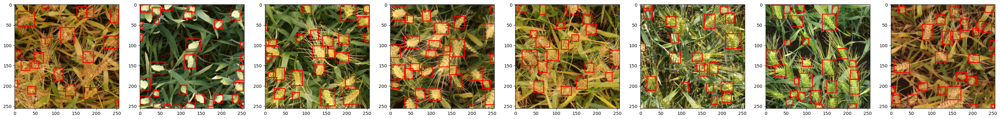

In [65]:
show_test_images(test_image_ids[0:8], test_predictions)

In [75]:
model.save_weights('wheat_detection_model')

In [76]:
model.save("Wheat Detection.h5")